In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

import geopandas as gpd
from shapely.geometry import Point


import functools
from itertools import product
import contextily as ctx

pd.options.display.max_columns = None
#pd.options.display.max_rows = None

from mpl_toolkits.axes_grid1 import make_axes_locatable

from sklearn import preprocessing

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.cm as cm
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D 
import matplotlib.colors as colors

In [2]:
#import base file
df = pd.read_csv("pm_no_clean.csv", index_col=0)

In [3]:
df = df.drop_duplicates(subset=['borough'])

In [4]:
#creating sum column for correlated transport modes
df['v_tot'] = df[' VKM Bus'] + df[' VKM Motorcycle'] + df[' VKM Taxi'] + df[' VKM Coach']

In [5]:
df = df[['borough', 'v_tot', ' VKM TOTAL']]

In [6]:
#load london borough shape file
fp = "/Users/oliverpaul/Data_Science/EDF/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp"
map_df = gpd.read_file(fp).to_crs({'init': 'epsg:4326'})
map_df = map_df.rename(columns={"NAME": "borough"})
map_df.sample(5)

,borough,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry
19,Richmond upon Thames,E09000027,5876.111,135.443,F,None,None,"POLYGON ((-0.32173 51.46541, -0.32172 51.46536..."
21,Wandsworth,E09000032,3522.022,95.600,T,None,None,"POLYGON ((-0.22343 51.47152, -0.22327 51.47146..."
22,Hammersmith and Fulham,E09000013,1715.409,75.648,T,None,None,"POLYGON ((-0.24456 51.48870, -0.24460 51.48879..."
8,Brent,E09000005,4323.270,0.000,F,None,None,"POLYGON ((-0.19657 51.52765, -0.19685 51.52773..."
11,Southwark,E09000028,2991.340,105.139,T,None,None,"POLYGON ((-0.10892 51.50844, -0.10889 51.50845..."


In [7]:
borough_map = map_df.to_crs({'init': 'epsg:3857'})

In [8]:
def clean_boroughs(txt):
    if pd.isna(txt):
        return np.nan
    txt = txt.replace('Barking & Dagenham', 'Barking and Dagenham')
    txt = txt.replace('Richmond', 'Richmond upon Thames')
    txt = txt.replace('Hammersmith & Fulham', 'Hammersmith and Fulham')
    txt = txt.replace('Kingston', 'Kingston upon Thames')
    txt = txt.replace('Kensington & Chelsea', 'Kensington and Chelsea')
    return txt

In [9]:
df['borough'] = df['borough'].apply(clean_boroughs)

In [10]:
#merging the two datasets together
borough_map = pd.merge(borough_map, df, how='left', on='borough')

In [11]:
borough_map['Vehicle Flows'] =   pd.cut(borough_map['v_tot'], 10, labels=["1", "2", "3","4", "5", "6","7", "8", "9","10"])

In [12]:
borough_map['Vehicle Flows Total'] =   pd.cut(borough_map[' VKM TOTAL'], 10, labels=["1", "2", "3","4", "5", "6","7", "8", "9","10"])

In [13]:
scaler = preprocessing.MinMaxScaler()
borough_map['Scaled Vehicle Flows'] = scaler.fit_transform(borough_map[["v_tot"]])

In [14]:
scaler = preprocessing.MinMaxScaler()
borough_map['Scaled Vehicle Flows Total'] = scaler.fit_transform(borough_map[[" VKM TOTAL"]])

In [15]:
borough_map['Vehicle Flows'] =   pd.cut(borough_map['Scaled Vehicle Flows'], 10, labels=[1, 2, 3,4, 5,6,7, 8, 9,10])

In [16]:
borough_map['Vehicle Flows Total'] =   pd.cut(borough_map['Scaled Vehicle Flows Total'], 10, labels=[1, 2, 3,4, 5,6,7, 8, 9,10])

In [17]:
borough_map['Vehicle Flows'] = borough_map['Vehicle Flows'].astype(int)

In [18]:
borough_map['Vehicle Flows Total'] = borough_map['Vehicle Flows Total'].astype(int)

In [19]:
borough_map['Vehicle Flows'] = borough_map['Vehicle Flows'].replace(-9223372036854775808, np.nan)

In [20]:
borough_map['Vehicle Flows Total'] = borough_map['Vehicle Flows Total'].replace(-9223372036854775808, np.nan)

In [21]:
df_2 = pd.read_csv("pm_no_clean.csv", index_col=0)

In [22]:
df_2 = df_2.drop_duplicates(subset=['pod_id_location'])

In [23]:
geometry = [Point(xy) for xy in zip(df_2.Longitude, df_2.Latitude)]
crs = {'init': 'epsg:4326'}
gdf = gpd.GeoDataFrame(df_2, crs = crs, geometry=geometry)
gdf = gdf.to_crs({'init': 'epsg:3857'})

In [24]:
gdf['Site_Type_y'] = gdf['Site_Type_x'].replace('Individual ', 'Other')

In [25]:
def make_plot(flow_type, title):

    c = ['#FF00FF', '#0080FF', '#00FF11']  ##FF00FF pink
    custom = matplotlib.colors.ListedColormap(c)

    plt.rcParams['figure.dpi'] = 600


    ax = borough_map.plot(figsize=(10, 8), 
                          column=flow_type, 
                          cmap = 'Reds', edgecolor='k', 
                          categorical=True, 
                          linewidth=1, alpha=1, 
                          legend=False, 
                          missing_kwds={"color": "lightgrey", "edgecolor": "red","hatch": "///","label": "Missing values"},
                          legend_kwds={'loc': 3})

    gdf[(gdf['tot_avg_no2'] >= 40)].plot(column ='Site_Type_y', 
                                         ax=ax, 
                                         legend=True, 
                                         cmap=custom, 
                                         edgecolor='black', 
                                         markersize = gdf['tot_avg_no2']**1.25, 
                                         alpha = 0.85)
    ctx.add_basemap(ax=ax)

    cmap = cm.get_cmap('Reds')
    x1 = mpatches.Patch(color=cmap(0.0), label='1st Decile')
    x2 = mpatches.Patch(color=cmap(0.15), label='2nd Decile')
    x3 = mpatches.Patch(color=cmap(0.3), label='3rd Decile')
    x4 = mpatches.Patch(color=cmap(0.45), label='4th Decile')
    x5 = mpatches.Patch(color=cmap(0.7), label='5th Decile')
    x6 = mpatches.Patch(color=cmap(1.0), label='10th Decile')
    x7 = mpatches.Patch(edgecolor='red', facecolor='lightgray', hatch='///', label = 'Missing Data')

    leg_1 = ax.legend(handles=[x1, x2, x3, x4, x5, x6, x7], loc = 3, fontsize ='small')

    circ1 = Line2D([0], [0], linestyle="none", marker="o", markersize=10, markerfacecolor="#FF00FF", alpha = 0.85)
    circ2 = Line2D([0], [0], linestyle="none", marker="o", markersize=10, markerfacecolor="#00FF11", alpha = 0.85)
    circ3 = Line2D([0], [0], linestyle="none", marker="o", markersize=10, markerfacecolor="#0080FF", alpha = 0.85)
    circ4 = Line2D([0], [0], linestyle="none", marker="o", markersize=17, markerfacecolor="lightgray", alpha = 0.85)
    circ5 = Line2D([0], [0], linestyle="none", marker="o", markersize=10, markerfacecolor="lightgray", alpha = 0.85)

    leg_2 = ax.legend((circ1, circ2, circ3, circ4, circ5), ("Hospital", "School", "Other", "Higher Average", "Lower Average"), 
                      numpoints=1, 
                      loc=1)

    ax.add_artist(leg_1).set_title('Relative traffic\nflow volume\n') 

    ax.set_title('Breathe London sensor locations with average annual No2 measurements above\n40 μg/m3 with borough level total traffic flows for' + title, 
                 fontdict={'fontsize': '12', 'fontweight' : '2'})

    plt.axis('off')
    plt.show()

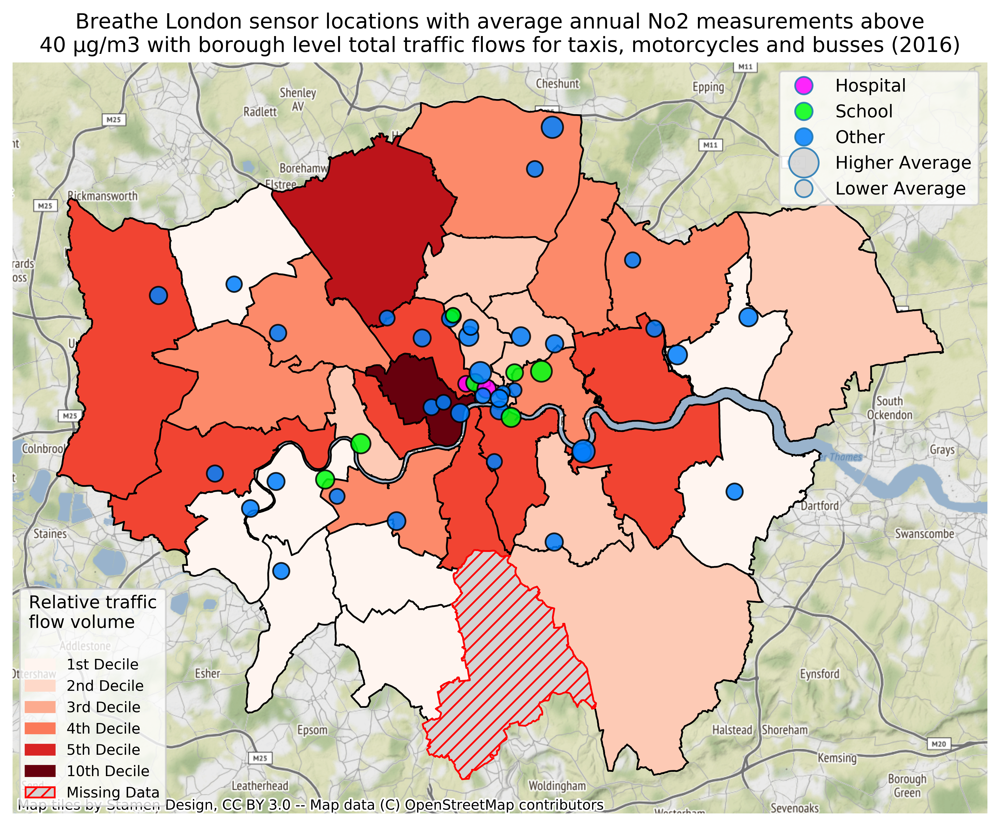

In [26]:
#to call plot either 'Vehicle Flows' for sum flows of taxis, coaches, motorbikes and busses, or 'Vehicle Flows Total' for all vehicle type flows for 2016
title_vehicle_flow = ' taxis, motorcycles and busses (2016)'
title_vehicle_flow_total = ' all vehicle types (2016)'

make_plot('Vehicle Flows', title_vehicle_flow)

In [28]:
#sensor with second highest average pm25 is a school...

In [29]:
df_3 = pd.read_csv("pm_no_clean.csv", index_col=0)

In [30]:
df_3['date_UTC'] = pd.to_datetime(df_3["date_UTC"])
df_3['no2_ugm3'] = df_3['no2_ugm3'].fillna(0)

In [31]:
df_3 = df_3.groupby([df_3['date_UTC'].dt.hour, df_3['borough']]).no2_ugm3.mean().reset_index()

In [32]:
df_3['borough'] = df_3['borough'].apply(clean_boroughs)

In [33]:
borough_map_2 = map_df.to_crs({'init': 'epsg:3857'})

In [34]:
borough_map_2 = pd.merge(borough_map_2, df_3, how='left', on='borough')

In [36]:
df_4 = pd.read_csv("pm_no_clean.csv", index_col=0)
df_4['date_UTC'] = pd.to_datetime(df_4["date_UTC"])
df_4 = df_4[(df_4['pod_id_location']!=75245) & (df_4['pod_id_location']!=93245) & (df_4['pod_id_location']!=652450)]

In [37]:
df_4 = df_4.groupby([df_4['date_UTC'].dt.hour, df_4['pod_id_location'], df_4['Latitude'], df_4['Longitude']]).no2_ugm3.mean().reset_index()

In [38]:
geometry = [Point(xy) for xy in zip(df_4.Longitude, df_4.Latitude)]
crs = {'init': 'epsg:4326'}
gdf_2 = gpd.GeoDataFrame(df_4, crs = crs, geometry=geometry)
gdf_2 = gdf_2.to_crs({'init': 'epsg:3857'})

In [39]:
#getting croydon as single row
df_croydon = borough_map_2[(borough_map_2['borough'] == 'Croydon')]

In [40]:
#same for waltham forest
df_Waltham_Forest = borough_map_2[(borough_map_2['borough'] == 'Waltham Forest')]
df_Waltham_Forest = df_Waltham_Forest.drop_duplicates(subset=['borough'])

In [41]:
#same for Bromley
df_bromley = borough_map_2[(borough_map_2['borough'] == 'Bromley')]
df_bromley = df_bromley.drop_duplicates(subset=['borough'])

In [42]:
df_sutton = borough_map_2[(borough_map_2['borough'] == 'Sutton')]
df_sutton = df_sutton.drop_duplicates(subset=['borough'])

In [44]:
gdf_2 = gdf_2.dropna(subset=['no2_ugm3'])
gdf_2['no2_ugm3'] = gdf_2['no2_ugm3'].astype(int)

In [62]:
def get_gif(time, clock, name):

    plt.rcParams['figure.dpi'] = 220

    gdf_hour = gdf_2[(gdf_2['date_UTC'] == time)] ######

    fig, ax = plt.subplots(1, 1, figsize=(10, 8))

    vmin, vmax = 15, 62

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)

    circ1 = Line2D([0], [0], linestyle="none", marker="o", markersize=17, markerfacecolor="lightgray", alpha = 0.7)
    circ2 = Line2D([0], [0], linestyle="none", marker="o", markersize=10, markerfacecolor="lightgray", alpha = 0.7)

    leg_1 = ax.legend((circ1, circ2), ("Higher Average", "Lower Average"), 
                      numpoints=1, 
                      loc=4)

    x1 = mpatches.Patch(edgecolor='k', facecolor='lightgray', hatch='///', label = 'Missing or incomplete data')
    leg_2 = ax.legend(handles=[x1], loc = 3, fontsize ='small')

    ax.add_artist(leg_1)

    props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
    ax.text(0.82, 0.95, clock, transform=ax.transAxes, fontsize=16, ######
            verticalalignment='top', bbox=props)

    ax = borough_map_2[(borough_map_2['date_UTC'] == time)].plot(figsize=(10, 8), ######
                                                                edgecolor='k',
                                                               column='no2_ugm3',
                                                               cmap ='Reds',
                                                               norm=plt.Normalize(vmin=vmin, vmax=vmax),
                                                               legend=False,
                                                               cax=cax,
                                                               ax=ax)

    df_croydon.plot(ax=ax, edgecolor='k', facecolor='lightgray', hatch='///')
    df_Waltham_Forest.plot(ax=ax, edgecolor='k', facecolor='lightgray', hatch='///')
    df_bromley.plot(ax=ax, edgecolor='k', facecolor='lightgray', hatch='///')
    df_sutton.plot(ax=ax, edgecolor='k', facecolor='lightgray', hatch='///')
    
    gdf_hour.plot(ax=ax, edgecolor='black', markersize = gdf_hour['no2_ugm3']**1.25, alpha = 0.7)

    ctx.add_basemap(ax=ax)

    norm = colors.Normalize(vmin=vmin, vmax=vmax)
    cbar = plt.cm.ScalarMappable(norm=norm, cmap='Reds')
    ax_cbar = fig.colorbar(cbar, ax=ax, cax=cax)
    ax_cbar.set_label('Average hourly Borough No2, μg/m3')

    ax.set_title('Hourly London borough No2 averages based on Breathe London measurements', 
                 fontdict={'fontsize': '13', 'fontweight' : '2'})

    ax.axis('off')
    plt.savefig('/Users/oliverpaul/Data_Science/EDF/plots/gif_map/'+name, bbox_inches = 'tight', pad_inches = 0.1)

In [28]:
#time - float, clock - string
#for hour in range(24):
    #get_gif(float(hour), f"{hour:02}:00:00", f"{hour:02}.png")

<img src="EDF_No2.gif">

### This should ideally be done by filtering only roadside or background, however either way it is flawed by low resolution. It would be interesting to repeat such a mapping exercise with the regulatory sensor network also, then convert to raster and interpolate between points. The same could be done for wind direction for PM2.5 to show how levels change with winds coming from Europe.

In [ ]:
#to make gif
mport imageio
from IPython.display import Image

## Generating images
img_files = []

for date in track(dates):
    
    save_path = f'img/{date}.png'
    img_files += [save_path]
    
    fig.savefig(save_path)
    plt.close()

## Creating the GIF
for img_file in img_files:
    images.append(imageio.imread(img_file))

kwargs = {'duration': 0.15} ## <- seconds for each frame
imageio.mimsave('img/combnied_img.gif', images, 'GIF', **kwargs)